---

<h1 style="color:#012eba">Introduction to Image Processing with Python</h1>
<h1 style="color:#012eba">Episode 8: Homography Matrix</h1>

---

*DASCI 261 - Introduction to Image Processing*

*Prepared by Erika G. Lacson*

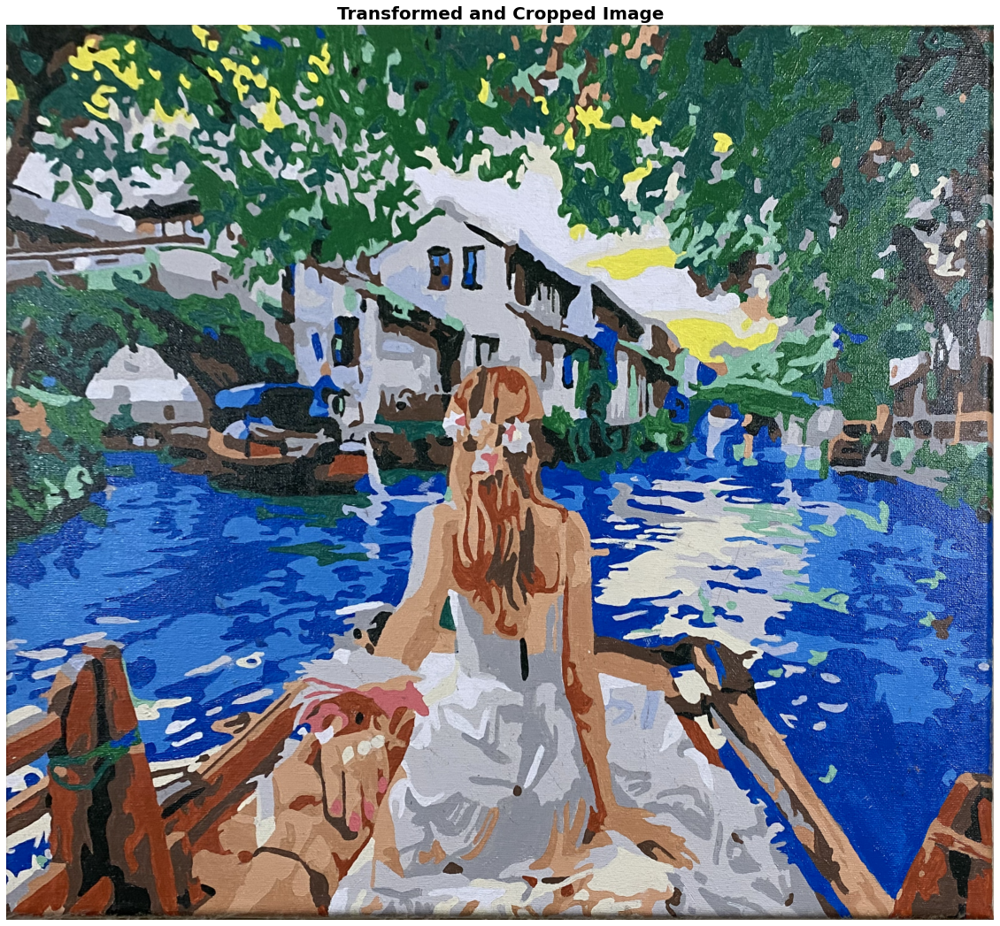

Photo by Author.

---
<h2 style="color:#ff0090">Introduction</h2>

Welcome back! 🙌 We’re near the end of our series, but I still have more to share. This time, we are turning the spotlight on one of my favorite topics in image processing — Homography Matrix! 💪🖼️

Fasten your seatbelts because this is going to be a thrilling ride! 🚀 Let’s jump right in!

---
<h2 style="color:#ff0090">Homography Matrix</h2>

Our journey begins with a deep dive into the homography matrix. As a fundamental tool in image processing, it plays a crucial role in capturing geometric transformations in an image. More specifically, it’s the mathematician’s secret weapon for understanding and manipulating perspective transformations. 🧐

Whether you’re interested in aligning images, creating panoramas, or just want to understand the intrinsic geometry of a scene, the homography matrix is a concept you’ll find incredibly useful.

<b>Homography</b> is defined as the mapping between two planar projections of an image. It is represented by a 3x3 transformation matrix in a homogenous coordinates space. These transformations can be a combination of rotation, translation, scaling, or skew operations.

To illustrate:

<img src="transform.png" alt="transform" width="400"/>

Image by Borja, B.

The documentation for the transform in skimage summarizes these transforms neatly:

https://scikit-image.org/docs/stable/auto_examples/transform/plot_transform_types.html

However, these examples explicitly defines the transform. What if we are given the input and output image? Depending on the transform, we would need several points to compute for our homography matrix. Let’s do it!

As usual, let’s import the necessary libraries and set the scene for our Homography Matrix exploration:

In [1]:
# Import libraries
from skimage.io import imread, imshow
import matplotlib.pyplot as plt
import numpy as np
from skimage import transform

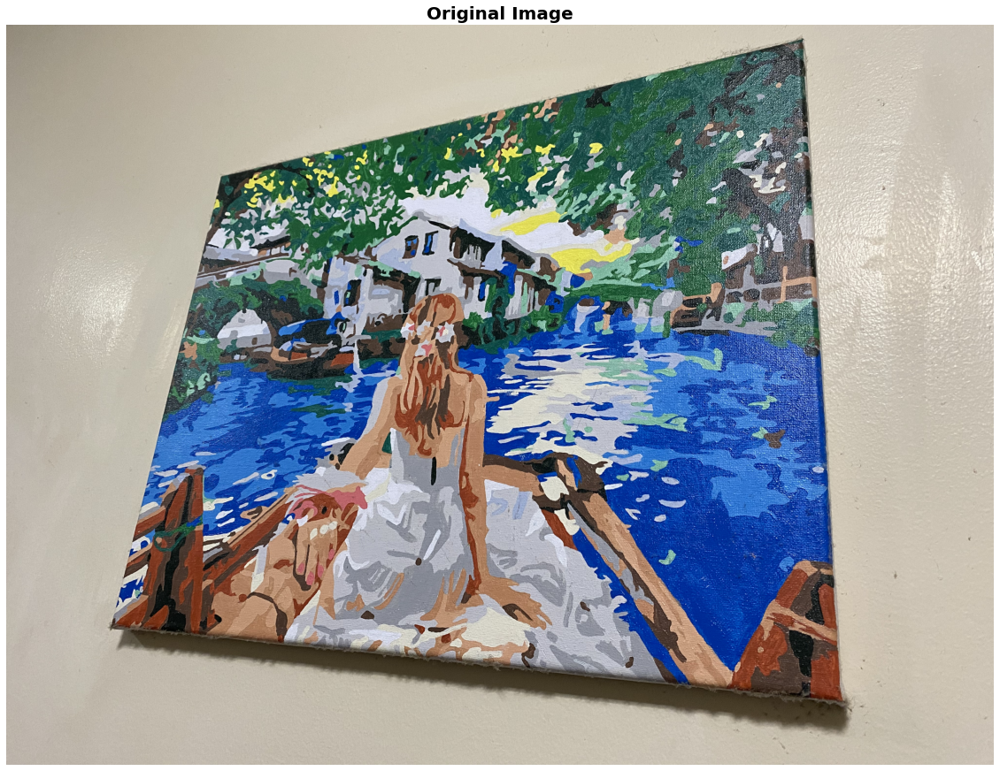

In [2]:
# Display the original image

image = imread('painting.png')
plt.figure(figsize=(20,20))
plt.imshow(image)
plt.title('Original Image', fontsize=20, weight='bold')
plt.axis('off')
plt.show()

Original Image. Photo by Author.

Now we want to have a top down view of this painting. We would need to compute for the homography matrix. We have to determine the corners of the painting. In this case, I used paint app to identify the coordinates:

In [3]:
# Source points
src = np.array([879, 625,                    # top left
                431, 2466,                   # bottom left
                3251, 61,                    # top right
                3416, 2767]).reshape((4, 2)) # bottom right



To perform a homography transformation, we’ll need a set of destination points that correspond to the source points. These destination points represent where we want the source points to be in the output image. For a top-down view, we might want the minimum and maximum x and y values of the source points:



In [4]:
# Destination points
dst = np.array([
    [np.min(src[:, 0]), np.min(src[:, 1])],  # top left
    [np.min(src[:, 0]), np.max(src[:, 1])],  # bottom left
    [np.max(src[:, 0]), np.min(src[:, 1])],  # top right
    [np.max(src[:, 0]), np.max(src[:, 1])],  # bottom right
])

We know that the transformation is projective, so we use that as our parameter:

In [7]:
tform = transform.estimate_transform('projective', src, dst)

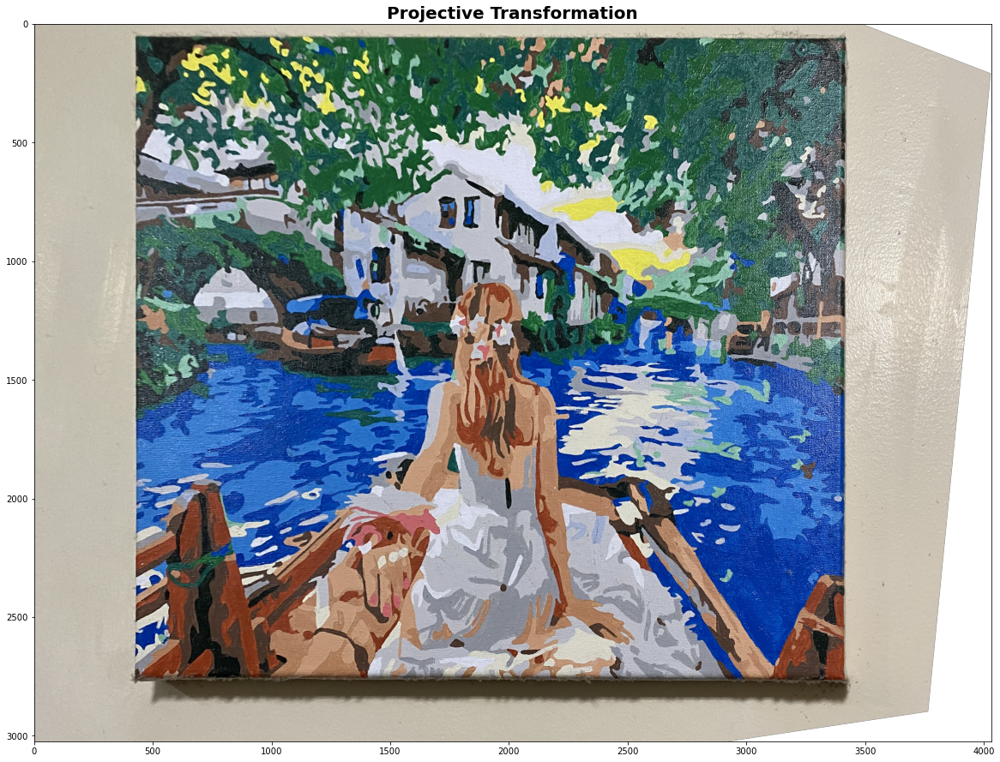

In [8]:
tf_img = transform.warp(image, tform.inverse)
fig, ax = plt.subplots(figsize=(20,20))
ax.imshow(tf_img)
_ = ax.set_title('Projective Transformation', fontsize=20, weight='bold')

Transformed Image. Photo by Author.

Considering that the output looks weird with added white pixels outside the wall, we can edit out code to crop the wall and the extra pixels altogether:

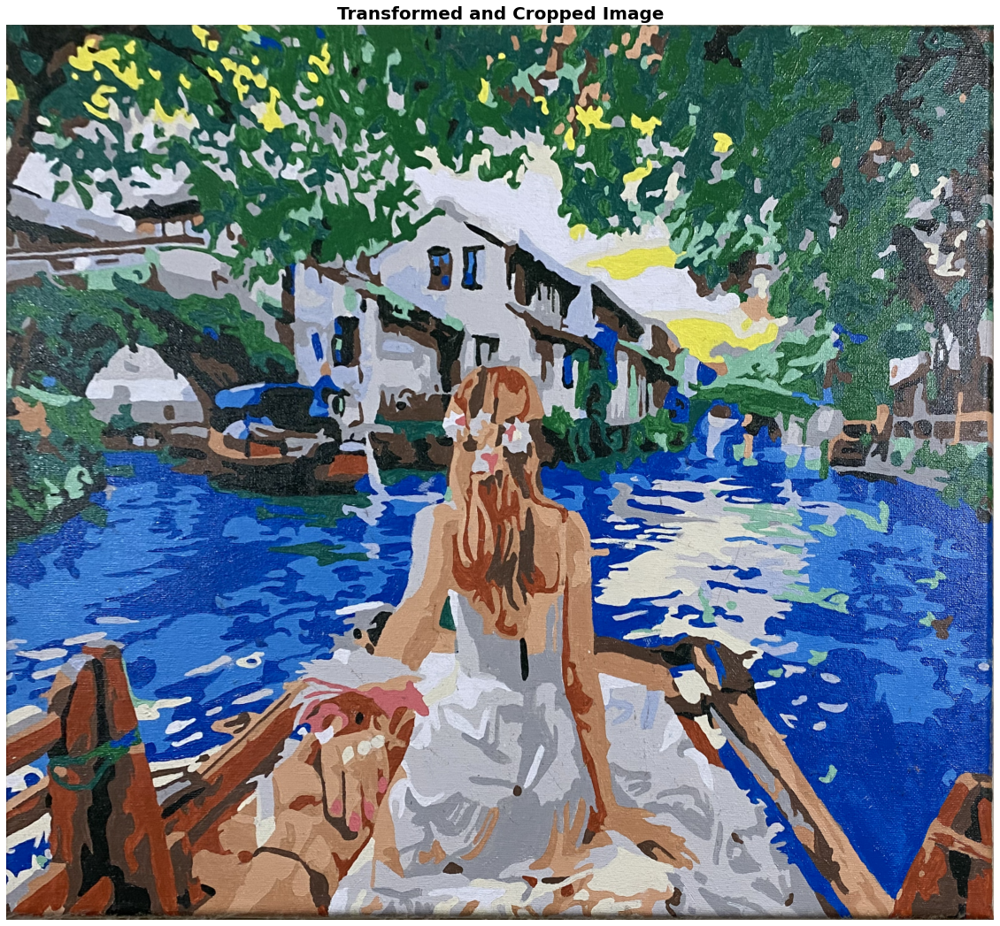

In [9]:
# Load the image
image = imread('painting.png')

# Source points
src = np.array([879, 625,                    # top left
                431, 2466,                   # bottom left
                3251, 61,                    # top right
                3416, 2767]).reshape((4, 2)) # bottom right

# Estimate the width and height from the source points
width = np.max(src[:, 0]) - np.min(src[:, 0])
height = np.max(src[:, 1]) - np.min(src[:, 1])

# Destination points (forming a box shape)
dst = np.array([
    [0, 0],
    [0, height],
    [width, 0],
    [width, height]
])

# Compute the projective transform
tform = transform.estimate_transform('projective', src, dst)

# Apply the transformation
warped_image = transform.warp(image, tform.inverse, output_shape=(height, width))

# Convert the warped image to uint8
warped_image_uint8 = (warped_image * 255).astype(np.uint8)

# Display the transformed and cropped image
plt.figure(figsize=(20,20))
plt.imshow(warped_image_uint8)
plt.title('Transformed and Cropped Image', fontsize=20, weight='bold')
plt.axis('off')
plt.show()

Transformed and Cropped Image. Photo by Author.

There you have it, a pretty and clean looking top-down view of a painting.

Once we have the homography matrix, we can also use it to transform one image to align with the perspective of another image. This can be useful for applications like image stitching (think panorama photos 🏞️), or aligning images for comparison or subtraction. The possibilities are endless!



---
<h2 style="color:#ff0090">Conclusion</h2>

In this episode, we’ve taken a deep dive into the world of Homography Matrices, a powerful tool in the realm of image transformations. By understanding how this mathematical secret weapon works, we’ve managed to unlock a range of possibilities — from aligning images and creating panoramas to generating top-down views of scenes! 🗝️🌟

The thrilling part about image processing is that there’s always more to learn, always more to discover. Every new concept brings with it a host of new applications, challenging us to look at the world in different ways. 🌍💫

Homography Matrix is undoubtedly one of those versatile tools that can drastically expand your image processing toolbox, and I hope this deep dive has sparked your curiosity to explore more! 🔍💡

Stay tuned for our last episode, where we continue this exciting journey through the cosmos of image processing! Until then, keep exploring, keep learning, and remember — in the world of image processing, the only limit is your imagination! 🚀

---
<h2 style="color:#ff0090">References</h2>

- Borja, B. (2023). Lecture 8: Homography Matrix and Texture Metrics [Jupyter Notebook]. Introduction to Image Processing 2023, Asian Institute of Management.